In [47]:
# Optimize  the use of resources for police .

# KNN , DBSCAN.

In [48]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import seaborn as sns
import matplotlib as mpl
import geojson as gj
import plotly.express as px
import json
import urllib.request
import requests
from urllib.request import urlopen
from IPython.display import display
from sklearn.cluster import KMeans , AgglomerativeClustering
plt.style.use('fivethirtyeight')
mpl.rcParams['lines.linewidth'] = 4
mpl.rcParams['lines.color'] = 'r'

In [49]:
df = pd.read_csv("Data/london_crime_2010_2020.csv")

In [50]:
df.head()

,MajorText,MinorText,LookUp_BoroughName,201004,201005,201006,201007,201008,201009,201010,...,201910,201911,201912,202001,202002,202003,202004,202005,202006,202007
0,Arson and Criminal Damage,Arson,Barking and Dagenham,6,5,11,10,6,6,13,...,9,8,6,4,5,6,2,2,4,4
1,Arson and Criminal Damage,Criminal Damage,Barking and Dagenham,208,193,227,220,204,163,199,...,109,97,122,97,103,107,80,86,120,123
2,Burglary,Burglary Business and Community,Barking and Dagenham,49,58,59,47,46,51,52,...,30,30,26,31,17,28,29,16,16,28
3,Burglary,Domestic Burglary,Barking and Dagenham,118,102,124,137,153,136,116,...,97,114,130,116,123,97,57,42,63,72
4,Drug Offences,Drug Trafficking,Barking and Dagenham,9,6,5,12,9,7,11,...,10,14,3,17,6,6,17,18,11,21


In [51]:
rename_map = {
    "MajorText" : "Major Category",
    "MinorText": "Minor Category",
    "LookUp_BoroughName": "Borough"
}
df.rename(columns=rename_map, inplace=True)


In [52]:
df["Borough"].unique()

array(['Barking and Dagenham', 'Barnet', 'Bexley', 'Brent', 'Bromley',
       'Camden', 'Croydon', 'Ealing', 'Enfield', 'Greenwich', 'Hackney',
       'Hammersmith and Fulham', 'Haringey', 'Harrow', 'Havering',
       'Hillingdon', 'Hounslow', 'Islington', 'Kensington and Chelsea',
       'Kingston upon Thames', 'Lambeth', 'Lewisham',
       'London Heathrow and London City Airports', 'Merton', 'Newham',
       'Redbridge', 'Richmond upon Thames', 'Southwark', 'Sutton',
       'Tower Hamlets', 'Waltham Forest', 'Wandsworth', 'Westminster'],
      dtype=object)

In [53]:
len(df["Borough"].unique())

33

### Extract out the years. 

In [54]:
all_year_month_columns = df.columns[3:]
all_year_month_columns

Index(['201004', '201005', '201006', '201007', '201008', '201009', '201010',
       '201011', '201012', '201101',
       ...
       '201910', '201911', '201912', '202001', '202002', '202003', '202004',
       '202005', '202006', '202007'],
      dtype='object', length=124)

In [55]:
years_to_create = [
    "2011", "2012", 
    "2013", "2014", "2015", "2016", "2017", "2018", "2019"
]

In [56]:
# combine data and delete columns .
for year in years_to_create:
    col_to_combine = []
    for year_month in all_year_month_columns:
        if year_month.startswith(year):
            col_to_combine.append(year_month)
    
    # Now we have all columns for that year . ....
    new_column_name = f"Value_{year}"
    df[new_column_name] = df[col_to_combine].sum(axis=1)
    df.drop(columns=col_to_combine,inplace=True)

df.head()

,Major Category,Minor Category,Borough,201004,201005,201006,201007,201008,201009,201010,...,202007,Value_2011,Value_2012,Value_2013,Value_2014,Value_2015,Value_2016,Value_2017,Value_2018,Value_2019
0,Arson and Criminal Damage,Arson,Barking and Dagenham,6,5,11,10,6,6,13,...,4,132,75,52,65,77,74,78,58,68
1,Arson and Criminal Damage,Criminal Damage,Barking and Dagenham,208,193,227,220,204,163,199,...,123,2017,1613,1550,1553,1678,1816,1631,1392,1435
2,Burglary,Burglary Business and Community,Barking and Dagenham,49,58,59,47,46,51,52,...,28,740,665,574,541,448,454,364,387,362
3,Burglary,Domestic Burglary,Barking and Dagenham,118,102,124,137,153,136,116,...,72,1625,1795,1669,1369,1184,840,1229,1285,1185
4,Drug Offences,Drug Trafficking,Barking and Dagenham,9,6,5,12,9,7,11,...,21,82,76,69,89,53,79,63,76,88


In [57]:
remove_years = ["2010", "2020"]
current_df_col = df.columns
for year in remove_years:
    col_to_remove = []
    for year_month in current_df_col:
        if year_month.startswith(year):
            col_to_remove.append(year_month)
    df.drop(columns=col_to_remove,inplace=True)

df.head()

,Major Category,Minor Category,Borough,Value_2011,Value_2012,Value_2013,Value_2014,Value_2015,Value_2016,Value_2017,Value_2018,Value_2019
0,Arson and Criminal Damage,Arson,Barking and Dagenham,132,75,52,65,77,74,78,58,68
1,Arson and Criminal Damage,Criminal Damage,Barking and Dagenham,2017,1613,1550,1553,1678,1816,1631,1392,1435
2,Burglary,Burglary Business and Community,Barking and Dagenham,740,665,574,541,448,454,364,387,362
3,Burglary,Domestic Burglary,Barking and Dagenham,1625,1795,1669,1369,1184,840,1229,1285,1185
4,Drug Offences,Drug Trafficking,Barking and Dagenham,82,76,69,89,53,79,63,76,88


In [58]:
## Combine all c=major and minor categories and you can take out the year . 
df.drop("Minor Category", axis=1, inplace=True)
df.head()

,Major Category,Borough,Value_2011,Value_2012,Value_2013,Value_2014,Value_2015,Value_2016,Value_2017,Value_2018,Value_2019
0,Arson and Criminal Damage,Barking and Dagenham,132,75,52,65,77,74,78,58,68
1,Arson and Criminal Damage,Barking and Dagenham,2017,1613,1550,1553,1678,1816,1631,1392,1435
2,Burglary,Barking and Dagenham,740,665,574,541,448,454,364,387,362
3,Burglary,Barking and Dagenham,1625,1795,1669,1369,1184,840,1229,1285,1185
4,Drug Offences,Barking and Dagenham,82,76,69,89,53,79,63,76,88


In [59]:
len(df)

1721

In [60]:
# experiment for first year. ... 
col = [
    "Major Category",
    "Borough",
    "Value_2011",
]
df_11 = df[col]
df_11.head()

,Major Category,Borough,Value_2011
0,Arson and Criminal Damage,Barking and Dagenham,132
1,Arson and Criminal Damage,Barking and Dagenham,2017
2,Burglary,Barking and Dagenham,740
3,Burglary,Barking and Dagenham,1625
4,Drug Offences,Barking and Dagenham,82


In [61]:
df_11_fat = pd.crosstab(index=df["Borough"], columns=df["Major Category"], aggfunc="sum", values=df["Value_2011"])

In [62]:
all_values = df.columns[2:]
all_major = df.columns[:2]
borough = "Borough"
major_category = "Major Category"
dataFrame_dictionary = {}
for val in all_values:
    df_  = pd.crosstab(index=df[borough], columns=df[major_category], aggfunc="sum", values=df[val])
    dic_name = f"dataframe_{val}"
    df_.reset_index(inplace=True)
    df_.drop("Public Order Offences", axis=1, inplace=True)
    df_.drop("Historical Fraud and Forgery", axis=1, inplace=True)
    df_.drop("Miscellaneous Crimes Against Society", axis=1, inplace=True)	
    df_.columns.name = None # simplifies plot labeling
    df_.rename(columns={"Borough": "borough"}, inplace=True)
    df_["borough"] = df_["borough"].replace(['London Heathrow and London City Airports'],'City of London')
    dataFrame_dictionary[dic_name] = df_


In [63]:
dataFrame_dictionary.keys()

dict_keys(['dataframe_Value_2011', 'dataframe_Value_2012', 'dataframe_Value_2013', 'dataframe_Value_2014', 'dataframe_Value_2015', 'dataframe_Value_2016', 'dataframe_Value_2017', 'dataframe_Value_2018', 'dataframe_Value_2019'])

In [64]:
df_18 = dataFrame_dictionary["dataframe_Value_2018"]
df_18.head()

,borough,Arson and Criminal Damage,Burglary,Drug Offences,Possession of Weapons,Robbery,Sexual Offences,Theft,Vehicle Offences,Violence Against the Person
0,Barking and Dagenham,1450,1672,939,203,825,551,3299,2595,5553
1,Barnet,1926,3693,710,188,756,635,6465,5310,6622
2,Bexley,1526,1640,624,107,324,390,2870,2403,4338
3,Brent,2120,3261,1832,291,1459,688,6147,4071,8694
4,Bromley,2115,2596,715,210,454,582,5288,3498,5985


In [65]:
print(df.isnull().any())

Major Category    False
Borough           False
Value_2011        False
Value_2012        False
Value_2013        False
Value_2014        False
Value_2015        False
Value_2016        False
Value_2017        False
Value_2018        False
Value_2019        False
dtype: bool


In [66]:
df_18.shape

(33, 10)

In [67]:
df_18["borough"].unique()

array(['Barking and Dagenham', 'Barnet', 'Bexley', 'Brent', 'Bromley',
       'Camden', 'Croydon', 'Ealing', 'Enfield', 'Greenwich', 'Hackney',
       'Hammersmith and Fulham', 'Haringey', 'Harrow', 'Havering',
       'Hillingdon', 'Hounslow', 'Islington', 'Kensington and Chelsea',
       'Kingston upon Thames', 'Lambeth', 'Lewisham', 'City of London',
       'Merton', 'Newham', 'Redbridge', 'Richmond upon Thames',
       'Southwark', 'Sutton', 'Tower Hamlets', 'Waltham Forest',
       'Wandsworth', 'Westminster'], dtype=object)

In [68]:
df_18.describe().transpose().iloc[1:-2].sort_values(by = 'mean', ascending = False)

,count,mean,std,min,25%,50%,75%,max
Theft,33.0,6723.636364,5215.546734,1460.0,3819.0,5449.0,7581.0,31513.0
Burglary,33.0,2440.696970,857.335024,20.0,1938.0,2547.0,3035.0,4317.0
Drug Offences,33.0,1114.151515,585.821332,62.0,696.0,964.0,1497.0,2221.0
Robbery,33.0,1006.272727,647.372201,4.0,577.0,859.0,1459.0,3180.0
Sexual Offences,33.0,623.696970,247.250061,45.0,448.0,629.0,754.0,1281.0
Possession of Weapons,33.0,236.000000,115.244848,29.0,177.0,213.0,312.0,479.0


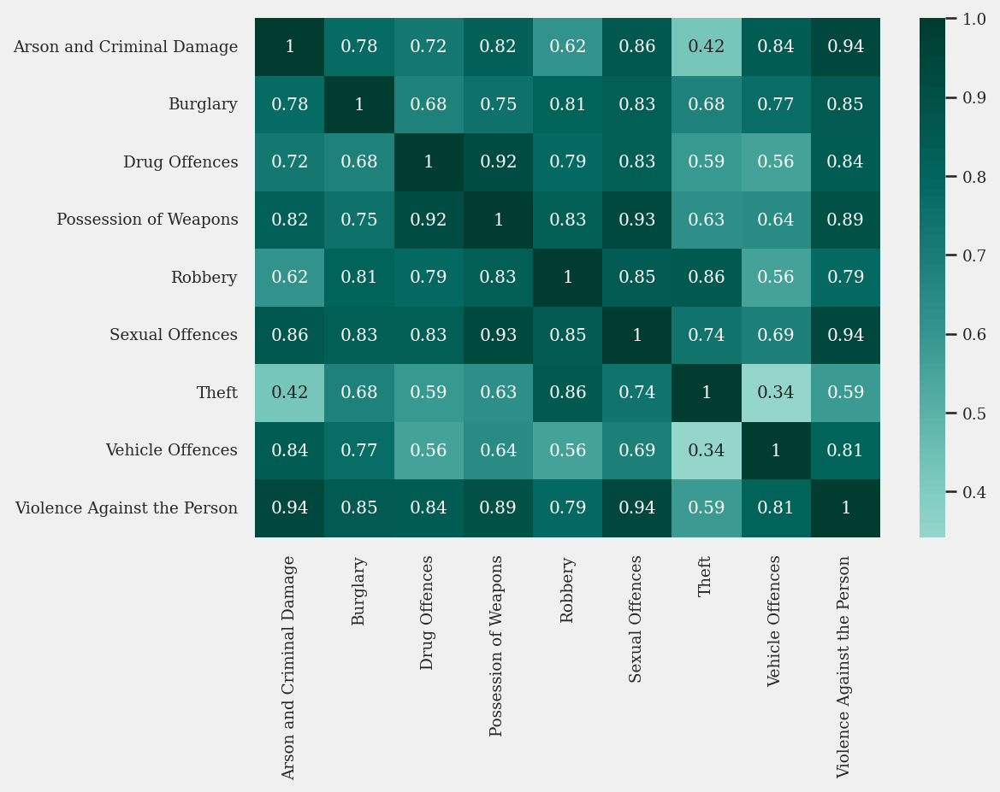

In [69]:
#create a figure to plot
plt.figure( dpi = 150,
           figsize=(7,5)
          )

#create a correlation matrix
corrMatrix = df_18.corr().round(3)

#relative size of the labels on the heatmap
sns.set( font_scale= 0.8 )
plt.rc('font', family='serif')


#plot the heat map
sns.heatmap( corrMatrix, annot = True , cmap = 'BrBG', center=0 )

#rotate the x and y tiks
plt.xticks( rotation = 90 )
plt.yticks( rotation = 0 )

plt.show()


In [70]:
important_crime_types = [
     'Burglary', 'Drug Offences',
     'Robbery',  'Theft',
]

In [71]:
from sklearn import preprocessing
df__ = df_18[important_crime_types]
df_standardized = preprocessing.scale( df_18[important_crime_types] )
df_standardized = pd.DataFrame( df_standardized )
df_standardized.head()
# center mean 

,0,1,2,3
0,-0.910514,-0.303620,-0.284355,-0.666802
1,1.483340,-0.700585,-0.392592,-0.050358
2,-0.948418,-0.849664,-1.070252,-0.750331
3,0.971641,1.244370,0.710174,-0.112275
4,0.183955,-0.691918,-0.866326,-0.279529


In [72]:
#create a list for the wcss parameter
wcss = []

#test with 14 clusters
for i in range(1, 15):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 11)
    kmeans.fit(df_standardized)
    wcss.append(kmeans.inertia_)
wcss

[132.0,
 66.14161748437512,
 40.73308086953066,
 22.98210238524412,
 18.76762313529189,
 15.054257548557715,
 12.03171582109656,
 9.548845268696997,
 8.470911439453166,
 7.603277229245575,
 6.4667609203400644,
 5.675501736498046,
 4.727845023147869,
 3.944437941750204]

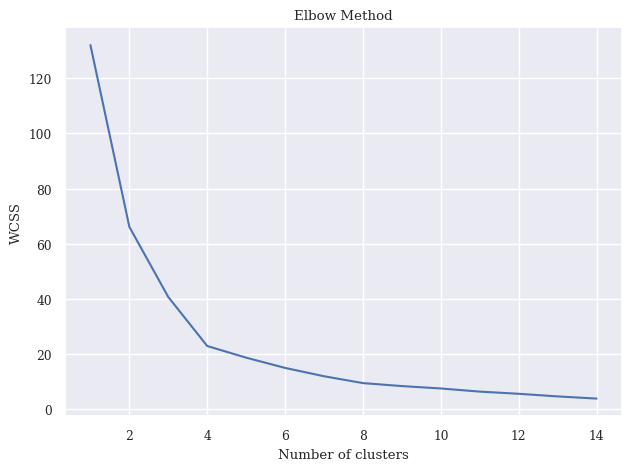

In [73]:
plt.plot(range(1, 15), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

# 4 relevant clusters . 

In [74]:
X = df_standardized

In [75]:
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(X)
pred_y

array([0, 0, 2, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 2, 2, 0, 0, 1, 0, 2, 1, 0,
       2, 2, 1, 0, 2, 1, 2, 1, 0, 0, 3])

In [76]:
df__.head()

,Burglary,Drug Offences,Robbery,Theft
0,1672,939,825,3299
1,3693,710,756,6465
2,1640,624,324,2870
3,3261,1832,1459,6147
4,2596,715,454,5288


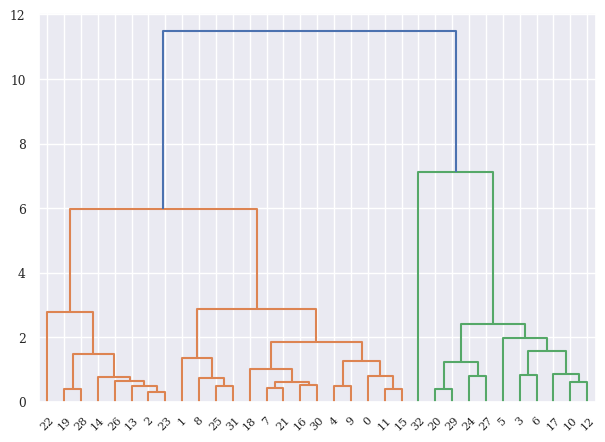

In [77]:
from  scipy.cluster import hierarchy as sch
dendrogram = sch.dendrogram(sch.linkage( X, method="ward"))

In [78]:
cluster = AgglomerativeClustering(n_clusters=4, affinity="euclidean", linkage="ward")
pred_hc = cluster.fit_predict(X)
pred_hc

array([0, 0, 1, 3, 0, 3, 3, 0, 0, 0, 3, 0, 3, 1, 1, 0, 0, 3, 0, 1, 3, 0,
       1, 1, 3, 0, 1, 3, 1, 3, 0, 0, 2], dtype=int64)

In [79]:
df_18['cluster'] = pred_y
df_18['cluster_hc'] = pred_hc
df_18[ ['cluster', 'borough'] ].head()

,cluster,borough
0,0,Barking and Dagenham
1,0,Barnet
2,2,Bexley
3,1,Brent
4,0,Bromley


In [80]:
df_18.head()

,borough,Arson and Criminal Damage,Burglary,Drug Offences,Possession of Weapons,Robbery,Sexual Offences,Theft,Vehicle Offences,Violence Against the Person,cluster,cluster_hc
0,Barking and Dagenham,1450,1672,939,203,825,551,3299,2595,5553,0,0
1,Barnet,1926,3693,710,188,756,635,6465,5310,6622,0,0
2,Bexley,1526,1640,624,107,324,390,2870,2403,4338,2,1
3,Brent,2120,3261,1832,291,1459,688,6147,4071,8694,1,3
4,Bromley,2115,2596,715,210,454,582,5288,3498,5985,0,0


In [81]:
colours_cluster = ['#004777', '#A30000', '#FF7700',
                   '#F564A9', '#00AFB5']

In [82]:
import json
# boroughs_geo = json.load(open('london.json' ,"r"))
boroughs_geo = json.load(open('london_boroughs.json' ,"r"))



In [83]:
boroughs_map = {}
for feature in boroughs_geo["features"]:
    feature["id"] = feature["properties"]["id"]
    boroughs_map[feature["properties"]["name"]] = feature["id"]
    

In [84]:
boroughs_map

{'Kingston upon Thames': 1,
 'Croydon': 2,
 'Bromley': 3,
 'Hounslow': 4,
 'Ealing': 5,
 'Havering': 6,
 'Hillingdon': 7,
 'Harrow': 8,
 'Brent': 9,
 'Barnet': 10,
 'Lambeth': 11,
 'Southwark': 12,
 'Lewisham': 13,
 'Greenwich': 14,
 'Bexley': 15,
 'Enfield': 16,
 'Waltham Forest': 17,
 'Redbridge': 18,
 'Sutton': 19,
 'Richmond upon Thames': 20,
 'Merton': 21,
 'Wandsworth': 22,
 'Hammersmith and Fulham': 23,
 'Kensington and Chelsea': 24,
 'Westminster': 25,
 'Camden': 26,
 'Tower Hamlets': 27,
 'Islington': 28,
 'Hackney': 29,
 'Haringey': 30,
 'Newham': 31,
 'Barking and Dagenham': 32,
 'City of London': 33}

In [85]:
df_18["id"] = df_18["borough"].apply(lambda x: boroughs_map[x])

In [86]:
df_18

,borough,Arson and Criminal Damage,Burglary,Drug Offences,Possession of Weapons,Robbery,Sexual Offences,Theft,Vehicle Offences,Violence Against the Person,cluster,cluster_hc,id
0,Barking and Dagenham,1450,1672,939,203,825,551,3299,2595,5553,0,0,32
1,Barnet,1926,3693,710,188,756,635,6465,5310,6622,0,0,10
2,Bexley,1526,1640,624,107,324,390,2870,2403,4338,2,1,15
3,Brent,2120,3261,1832,291,1459,688,6147,4071,8694,1,3,9
4,Bromley,2115,2596,715,210,454,582,5288,3498,5985,0,0,3
5,Camden,1673,3438,1318,222,1733,751,14421,3165,6885,1,3,26
6,Croydon,2568,2809,1696,390,1100,983,5841,4230,9213,1,3,2
7,Ealing,2146,2547,1182,218,859,704,6005,4214,8196,0,0,5
8,Enfield,2125,2970,960,251,1234,644,5273,5622,7050,0,0,16
9,Greenwich,2094,2396,883,208,644,732,5387,3519,7780,0,0,14


In [87]:
import plotly.express as px

In [88]:
fig = px.choropleth(df_18, locations="id", geojson=boroughs_geo, color="cluster" , hover_name="borough", hover_data=["cluster"])
fig.update_geos(fitbounds="locations", visible=False)
fig.show()

In [89]:
fig = px.choropleth_mapbox(
    df_18, locations="id", geojson=boroughs_geo, color="cluster" , hover_name="borough", hover_data=["cluster"],
    mapbox_style="carto-positron",
    center={"lat": 51.5 , "lon": 0},
    
    )

fig.show()

In [90]:
fig = px.choropleth_mapbox(
    df_18, locations="id", geojson=boroughs_geo, color="cluster_hc" , hover_name="borough", hover_data=["cluster_hc"],
    mapbox_style="carto-positron",
    center={"lat": 51.5 , "lon": 0},
    
    )

fig.show()

C:\Users\DELL\AppData\Local\Temp\ipykernel_5860\4278318384.py:8: MatplotlibDeprecationWarning:

Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.

C:\Users\DELL\AppData\Local\Temp\ipykernel_5860\4278318384.py:55: MatplotlibDeprecationWarning:

The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.



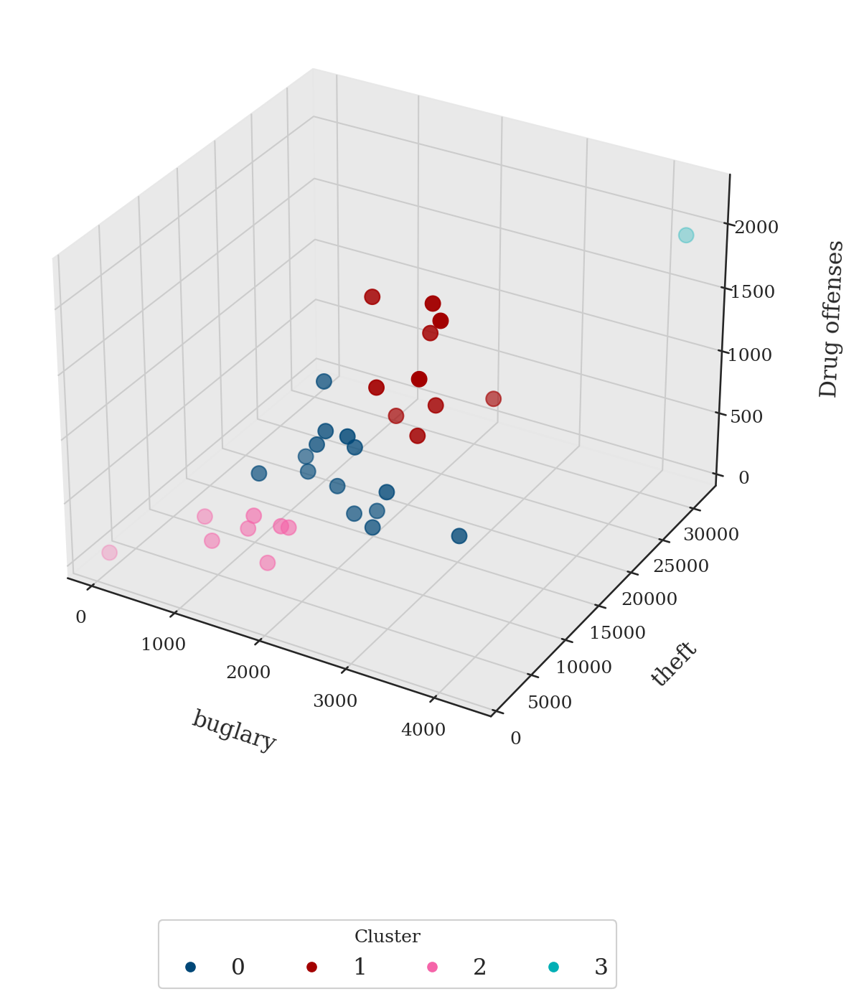

In [91]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.colors

sns.set( style = 'white' )
plt.rc('font', family='serif')

fig = plt.figure( figsize=(12.5, 7), dpi = 150 )
ax = Axes3D(fig)

c_background = '#FFFFFF'

#color for the XYZ planes for the 3d plots
rgba_planes = (231/255, 231/255, 231/255)

ax.set_facecolor( c_background )
ax.w_xaxis.set_pane_color( rgba_planes )
ax.w_yaxis.set_pane_color( rgba_planes )
ax.w_zaxis.set_pane_color( rgba_planes )
important_crime_types = [
     'Burglary', 'Drug Offences',
     'Robbery',  'Theft',
]
x = df_18['Burglary']
y = df_18['Theft']
z = df_18['Drug Offences']
colours = df_18['cluster']

cmap_clusters = matplotlib.colors.ListedColormap(colours_cluster)

g=ax.scatter(x, y, z, s=100,  c =  colours  , cmap=cmap_clusters  )


#label on axes
ax.set_xlabel('buglary',
             labelpad = 20,
             size = 15,
             )
ax.set_ylabel('theft',
             labelpad = 20,
             size = 15,
             )
ax.set_zlabel('Drug offenses',
             labelpad = 25,
             size = 15,
             )

#size of the axes
ax.tick_params( axis = 'x', labelsize = 12 )
ax.tick_params( axis = 'y', labelsize = 12 )
ax.tick_params( axis = 'z', labelsize = 12 )

legend = ax.legend(*g.legend_elements(), loc="lower center", prop = {'size':15},title="Cluster",
                   borderaxespad=-10, ncol=4)
ax.add_artist(legend)
ax.grid(b = True)

plt.show()

C:\Users\DELL\AppData\Local\Temp\ipykernel_5860\1266155082.py:8: MatplotlibDeprecationWarning:

Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.

C:\Users\DELL\AppData\Local\Temp\ipykernel_5860\1266155082.py:55: MatplotlibDeprecationWarning:

The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.



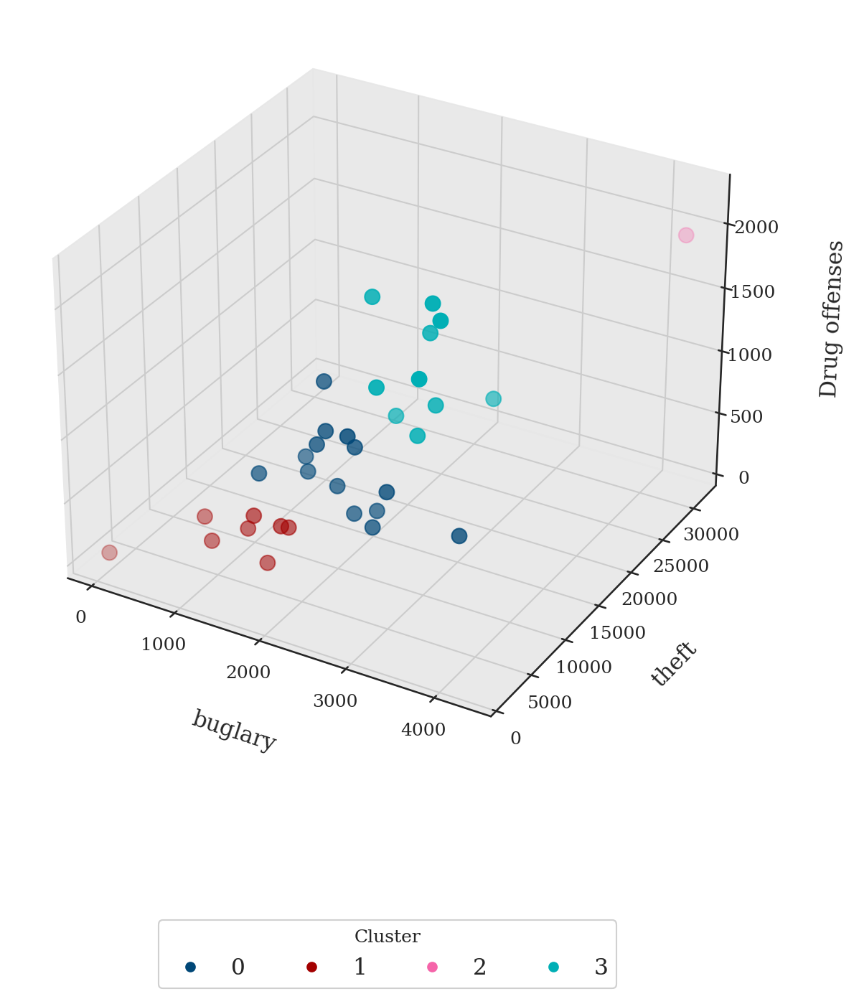

In [92]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.colors

sns.set( style = 'white' )
plt.rc('font', family='serif')

fig = plt.figure( figsize=(12.5, 7), dpi = 150 )
ax = Axes3D(fig)

c_background = '#FFFFFF'

#color for the XYZ planes for the 3d plots
rgba_planes = (231/255, 231/255, 231/255)

ax.set_facecolor( c_background )
ax.w_xaxis.set_pane_color( rgba_planes )
ax.w_yaxis.set_pane_color( rgba_planes )
ax.w_zaxis.set_pane_color( rgba_planes )
important_crime_types = [
     'Burglary', 'Drug Offences',
     'Robbery',  'Theft',
]
x = df_18['Burglary']
y = df_18['Theft']
z = df_18['Drug Offences']
colours = df_18['cluster_hc']

cmap_clusters = matplotlib.colors.ListedColormap(colours_cluster)

g=ax.scatter(x, y, z, s=100,  c =  colours  , cmap=cmap_clusters  )


#label on axes
ax.set_xlabel('buglary',
             labelpad = 20,
             size = 15,
             )
ax.set_ylabel('theft',
             labelpad = 20,
             size = 15,
             )
ax.set_zlabel('Drug offenses',
             labelpad = 25,
             size = 15,
             )

#size of the axes
ax.tick_params( axis = 'x', labelsize = 12 )
ax.tick_params( axis = 'y', labelsize = 12 )
ax.tick_params( axis = 'z', labelsize = 12 )

legend = ax.legend(*g.legend_elements(), loc="lower center", prop = {'size':15},title="Cluster",
                   borderaxespad=-10, ncol=4)
ax.add_artist(legend)
ax.grid(b = True)

plt.show()